## Introduction
### This project, will use a dataset containing the credit card usage behavior of around 9000 users over a six-month period. Steps include exploring the data, preprocess it, and applying clustering algorithms to segment the customers into different groups based on their usage behavior

## Objectives:

#### 1.Importing modules and data reading
#### 2.Perform data preprocessing before using models.
#### 3.Exploratory data analysis 
#### 4.Comparing and implementing different clustering models.
#### 5.Evaluation of clustering algorithms
#### 6.Interpretation and modelling of best clustering algorithms.
#### 7.Business Insights and recommendation including targeted marketing methods.
#### 8.Actionable insights

# Part 1 - Data Preprocessing

# Import Modules


In [20]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from scipy.stats import f_oneway
from sklearn.cluster import SpectralClustering
from sklearn.neighbors import kneighbors_graph
from scipy.sparse.linalg import eigsh
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage




# Data Reading

In [21]:
df = pd.read_csv('https://raw.githubusercontent.com/selvinfurtado01/data_projects/refs/heads/main/Customer_Data.csv')
df.head(10)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
6,C10007,627.260806,1.000000,7091.01,6402.63,688.38,0.000000,1.000000,1.000000,1.000000,0.000000,0,64,13500.0,6354.314328,198.065894,1.000000,12
7,C10008,1823.652743,1.000000,436.20,0.00,436.20,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,2300.0,679.065082,532.033990,0.000000,12
8,C10009,1014.926473,1.000000,861.49,661.49,200.00,0.000000,0.333333,0.083333,0.250000,0.000000,0,5,7000.0,688.278568,311.963409,0.000000,12
9,C10010,152.225975,0.545455,1281.60,1281.60,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,3,11000.0,1164.770591,100.302262,0.000000,12


In [22]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [24]:
# Here it is observed that there are 313 null values in the 'MINIMUM_PAYMENTS' column
df.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [25]:
# In order to address this problem, we can drop these values for the following reasons:
# 1. There are 313 missing values from the dataset of 8950 values which accounts for only 3.5% of the data for that column
#   Hence, these missing values can be dropped as they are not significant and will not impact the overall data
# 2. 'MINIMUM_PAYMENTS' column is a the minimum credit card balance payment to be made by the customer these values are calculated using 
#   different metrics and it is difficult to replicate without understanding said procedure. Hence we have concluded to drop these values
#   to better resolve this issue.

df.dropna(inplace = True)

In [26]:
# Verifying if the missing values in the 'MINIMUM_PAYMENTS' column have been dropped
df.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8636 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8636 non-null   object 
 1   BALANCE                           8636 non-null   float64
 2   BALANCE_FREQUENCY                 8636 non-null   float64
 3   PURCHASES                         8636 non-null   float64
 4   ONEOFF_PURCHASES                  8636 non-null   float64
 5   INSTALLMENTS_PURCHASES            8636 non-null   float64
 6   CASH_ADVANCE                      8636 non-null   float64
 7   PURCHASES_FREQUENCY               8636 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8636 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8636 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8636 non-null   float64
 11  CASH_ADVANCE_TRX                  8636 non-null   int64  
 12  PURCHASES_T

In [28]:
# Describing the data
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,1601.224893,0.895035,1025.433874,604.901438,420.843533,994.175523,0.496000,0.205909,0.368820,0.137604,3.313918,15.033233,4522.091030,1784.478099,864.304943,0.159304,11.534391
std,2095.571300,0.207697,2167.107984,1684.307803,917.245182,2121.458303,0.401273,0.300054,0.398093,0.201791,6.912506,25.180468,3659.240379,2909.810090,2372.566350,0.296271,1.310984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000
25%,148.095189,0.909091,43.367500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.559237,169.163545,0.000000,12.000000
50%,916.855459,1.000000,375.405000,44.995000,94.785000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.675701,312.452292,0.000000,12.000000
75%,2105.195853,1.000000,1145.980000,599.100000,484.147500,1132.385490,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.142090,825.496463,0.166667,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [29]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

## Data Transformation

Banks use 'PAYMENTS' and 'MINIMUM_PAYMENTS' to understand spending habits of customers which could be insightful while creating or
promoting future products as well as catering products based on their behaviour. 
This can also help to assign credit limit balance and under risky and stable spending behaviours of customers   

In [30]:
df[['PAYMENTS','MINIMUM_PAYMENTS']].describe()

,PAYMENTS,MINIMUM_PAYMENTS
count,8636.000000,8636.000000
mean,1784.478099,864.304943
std,2909.810090,2372.566350
min,0.049513,0.019163
25%,418.559237,169.163545
50%,896.675701,312.452292
75%,1951.142090,825.496463
max,50721.483360,76406.207520


Using 'PAYMENTS' and 'MINIMUM_PAYMENTS' to calculate the difference and understand the customer behaviour which is scaled between 0-1 this helps us understand the relationship between the two columns and analyze payment behaviour 

In [31]:
def payment_behaviour_scaled(row):
    # Calculate the difference between the two columns
    diff = row['PAYMENTS'] - row['MINIMUM_PAYMENTS']
    
    # Scale the difference to a range between 0 and 1 using a sigmoid-like function
    scaling_factor = 2000
    payment_behavior_score = 1 / (1 + np.exp(-diff / scaling_factor))
    return payment_behavior_score

# Create a new column for payment behaviour
df['PAYMENT_BEHAVIOR'] = df.apply(payment_behaviour_scaled, axis=1)

# Display new column
df[['PAYMENTS', 'MINIMUM_PAYMENTS', 'PAYMENT_BEHAVIOR']]

,PAYMENTS,MINIMUM_PAYMENTS,PAYMENT_BEHAVIOR
0,201.802084,139.509787,0.507786
1,4103.032597,1072.340217,0.819852
2,622.066742,627.284787,0.499348
4,678.334763,244.791237,0.553982
5,1400.057770,2407.246035,0.376696
...,...,...,...
8943,58.644883,43.473717,0.501896
8945,325.594462,48.886365,0.534533
8947,81.270775,82.418369,0.499857
8948,52.549959,55.755628,0.499599


The 'CREDIT_LIMIT' and 'BALANCE' can be used to calculate the utilization ratio which is very important aspect pertaining to credit cards and is vital information used by banks to understand customer credit card spending behaviours and track balances of individuals

In [32]:
df[['CREDIT_LIMIT', 'BALANCE']].describe()

,CREDIT_LIMIT,BALANCE
count,8636.000000,8636.000000
mean,4522.091030,1601.224893
std,3659.240379,2095.571300
min,50.000000,0.000000
25%,1600.000000,148.095189
50%,3000.000000,916.855459
75%,6500.000000,2105.195853
max,30000.000000,19043.138560


In [33]:
# The 'CREDIT_LIMIT' and 'BALANCE' is used to calculate the utilization ratio by dividing balance by credit limit 
def utilization_ratio(row):
    if row['BALANCE'] >= row['CREDIT_LIMIT']:
        util_ratio = 1
    else:
        util_ratio = row['BALANCE'] / row['CREDIT_LIMIT']
    return util_ratio

# Create a new column for utilization ratio based on 'CREDIT_LIMIT' and 'BALANCE'
df['UTILIZATION_RATIO'] = df.apply(utilization_ratio, axis=1)

# Display new column
df[['BALANCE', 'CREDIT_LIMIT', 'UTILIZATION_RATIO']]

,BALANCE,CREDIT_LIMIT,UTILIZATION_RATIO
0,40.900749,1000.0,0.040901
1,3202.467416,7000.0,0.457495
2,2495.148862,7500.0,0.332687
4,817.714335,1200.0,0.681429
5,1809.828751,1800.0,1.000000
...,...,...,...
8943,5.871712,500.0,0.011743
8945,28.493517,1000.0,0.028494
8947,23.398673,1000.0,0.023399
8948,13.457564,500.0,0.026915


'PURCHASES' is a combination of 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE' which calculates a customer total puchase amount and can track the customers spending habits and analyze this data based on spending behaviour.  

In [34]:
df[['PURCHASES', 'ONEOFF_PURCHASES']].describe()

,PURCHASES,ONEOFF_PURCHASES
count,8636.000000,8636.000000
mean,1025.433874,604.901438
std,2167.107984,1684.307803
min,0.000000,0.000000
25%,43.367500,0.000000
50%,375.405000,44.995000
75%,1145.980000,599.100000
max,49039.570000,40761.250000


In [35]:
# Here, the ratio of 'ONEOFF_PURCHASES' and 'PURCHASES' is used to understand impulse spending behaviour and mapped to a range of 0-1
def spending_ratio(row):
    if row['PURCHASES'] == 0:
        spend_ratio = 0
    elif row['ONEOFF_PURCHASES'] >= row['PURCHASES']:
        spend_ratio = 1
    else:
        spend_ratio = row['ONEOFF_PURCHASES'] / row['PURCHASES']
    return spend_ratio

# Create a new column for utilization ratio based on 'ONEOFF_PURCHASES' and 'PURCHASES'
df['SPEND_RATIO'] = df.apply(spending_ratio, axis=1)

# Display new column
df[['ONEOFF_PURCHASES', 'PURCHASES', 'SPEND_RATIO']]

,ONEOFF_PURCHASES,PURCHASES,SPEND_RATIO
0,0.00,95.40,0.0
1,0.00,0.00,0.0
2,773.17,773.17,1.0
4,16.00,16.00,1.0
5,0.00,1333.28,0.0
...,...,...,...
8943,20.90,20.90,1.0
8945,0.00,291.12,0.0
8947,0.00,144.40,0.0
8948,0.00,0.00,0.0


In [36]:
df[['ONEOFF_PURCHASES', 'PURCHASES', 'SPEND_RATIO']].describe()

,ONEOFF_PURCHASES,PURCHASES,SPEND_RATIO
count,8636.000000,8636.000000,8636.000000
mean,604.901438,1025.433874,0.380443
std,1684.307803,2167.107984,0.424327
min,0.000000,0.000000,0.000000
25%,0.000000,43.367500,0.000000
50%,44.995000,375.405000,0.120507
75%,599.100000,1145.980000,0.869388
max,40761.250000,49039.570000,1.000000


# Part 2 - Exploratory Data Analysis


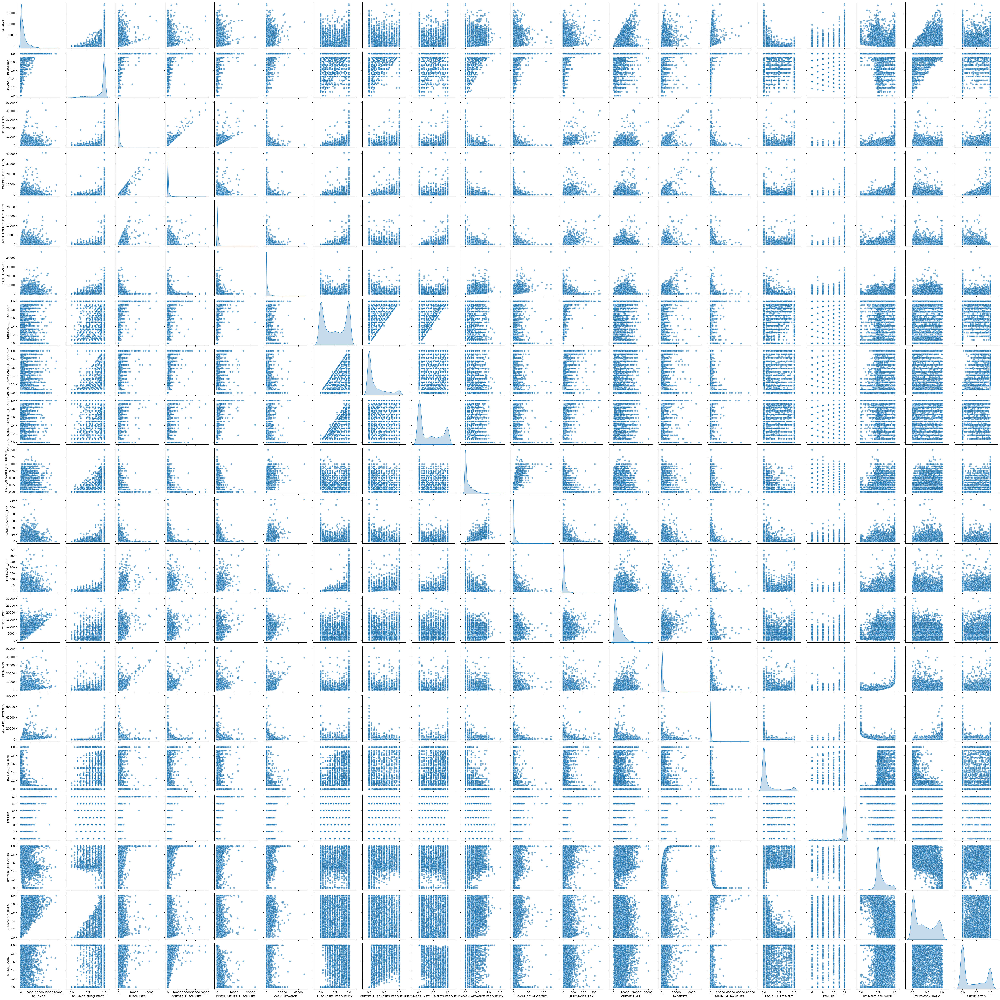

In [18]:
# Create a pair plot
plot_df = df.drop(columns=['CUST_ID'])

sns.pairplot(plot_df, diag_kind="kde", plot_kws={'alpha':0.6})
plt.show()

In [19]:
# Understanding the different Dataframe Columns:
# CUST_ID: Unique identifier for each customer.
# BALANCE: The current balance on the customer’s credit card.
# BALANCE_FREQUENCY: The frequency at which the balance is updated, ranging from 0 (no update) to 1 (frequently updated).
# PURCHASES: The total amount spent by the customer on purchases.
# ONEOFF_PURCHASES: The amount spent by the customer on one-time purchases (non-recurring).
# INSTALLMENTS_PURCHASES: The amount spent on purchases paid in installments.
# CASH_ADVANCE: The amount of cash borrowed on the credit card (cash advances).
# PURCHASES_FREQUENCY: Frequency of any purchase activity, ranging from 0 (no purchases) to 1 (frequent purchases).
# ONEOFF_PURCHASES_FREQUENCY: Frequency of one-off purchase activities.
# PURCHASES_INSTALLMENTS_FREQUENCY: Frequency of installment-based purchase activities.
# CASH_ADVANCE_FREQUENCY: Frequency of cash advances, ranging from 0 (no cash advances) to 1 (frequent cash advances).
# CASH_ADVANCE_TRX: The number of transactions where cash advances were taken.
# PURCHASES_TRX: The number of purchase transactions made by the customer.
# CREDIT_LIMIT: The credit limit assigned to the customer’s credit card.
# PAYMENTS: The total payments made by the customer towards the credit card balance.
# MINIMUM_PAYMENTS: The minimum amount the customer is required to pay on their balance.
# PRC_FULL_PAYMENT: The percentage of months where the customer paid the full balance.
# TENURE: The number of months the customer has been using the credit card.

In [20]:
# The different columns having values that range between 0-1
# BALANCE_FREQUENCY
# PURCHASES_FREQUENCY
# ONEOFF_PURCHASES_FREQUENCY
# PURCHASES_INSTALLMENTS_FREQUENCY
# CASH_ADVANCE_FREQUENCY
# PRC_FULL_PAYMENT

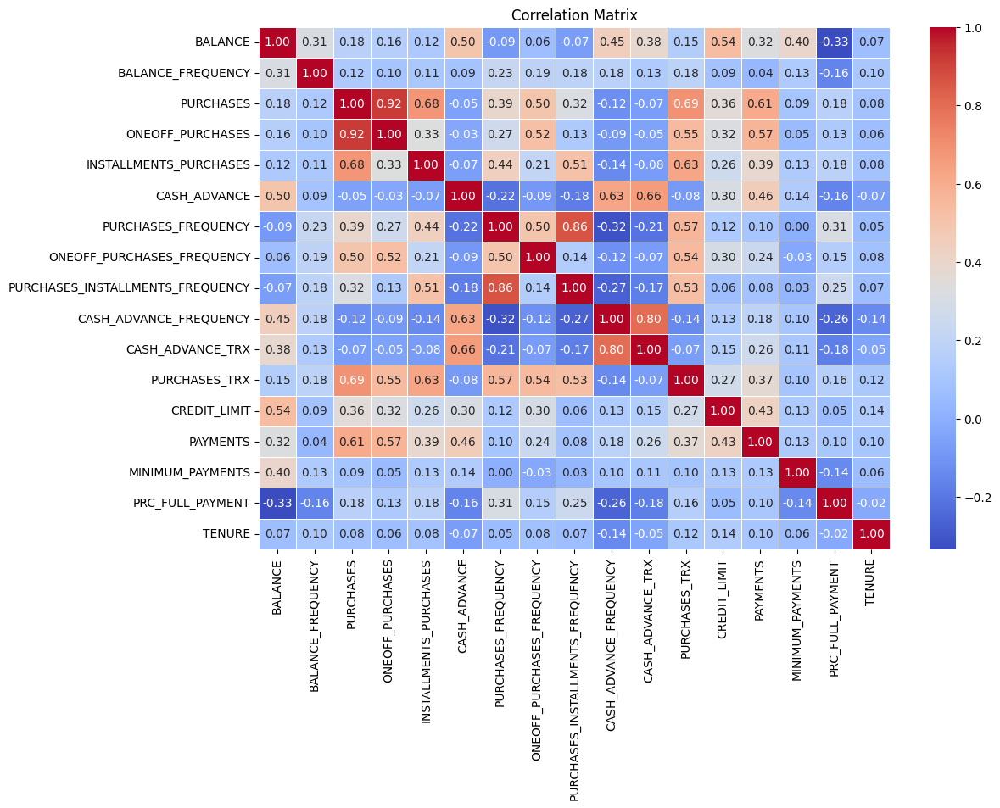

In [21]:
# Plotting the correlation matrix to understand the relationship between the different independent variables

# Calculate the correlation matrix
num_col_df = df.select_dtypes(include=['float64', 'int64'])
corr_matrix = num_col_df.corr()

# Plot Correlation Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

The correlation matrix visualizes the relationships between different credit card usage and payment features. Strong positive correlations (in red) are seen between PURCHASES and ONEOFF_PURCHASES and between CASH_ADVANCE and CASH_ADVANCE_TRX, indicating that higher purchases correlate with one-off purchases and that frequent cash advances lead to higher cash advance amounts. Negative correlations (in blue) are found between BALANCE and PRC_FULL_PAYMENT, suggesting that higher balances are associated with lower full payment rates. Overall, the matrix helps identify patterns in customer behaviors, such as frequent spending or cash advance tendencies, which will help us design targeted strategies.

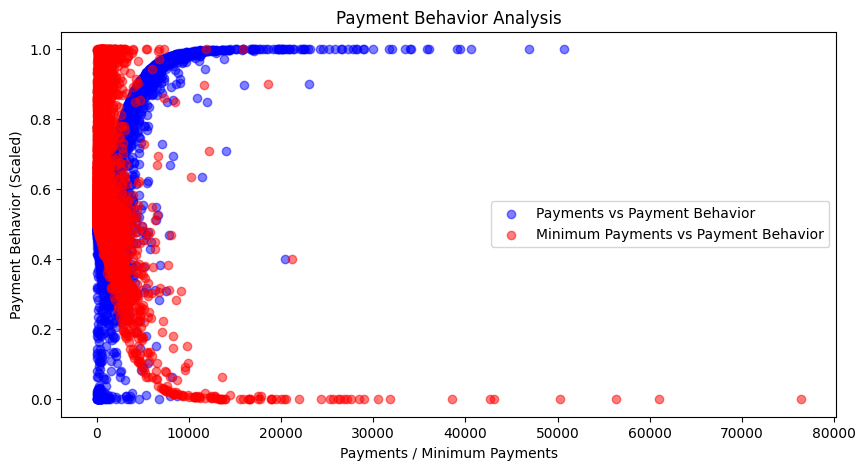

In [24]:

# let's plot the graph for Payments and Minimum Payments vs Payment Behavior
plt.figure(figsize=(10, 5))

# Plot Payments vs Payment Behavior
plt.scatter(df['PAYMENTS'], df['PAYMENT_BEHAVIOR'], color='blue', alpha=0.5, label='Payments vs Payment Behavior')

# Plot Minimum Payments vs Payment Behavior
plt.scatter(df['MINIMUM_PAYMENTS'], df['PAYMENT_BEHAVIOR'], color='red', alpha=0.5, label='Minimum Payments vs Payment Behavior')

# Add titles and labels
plt.title('Payment Behavior Analysis')
plt.xlabel('Payments / Minimum Payments')
plt.ylabel('Payment Behavior (Scaled)')
plt.legend()

plt.show()


Relation between Payments vs Payment behaviour(blue points), We can see as payments increase, the behavior score tends to quickly approach 1, indicating that customers paying significantly more than the minimum are classified as having strong payment behavior. Whereas, The red points represent the relationship between MINIMUM_PAYMENTS and PAYMENT_BEHAVIOR. When customers pay close to or just the minimum required, their payment behavior scores decrease, with many points clustering near 0, making them higher credit risk.

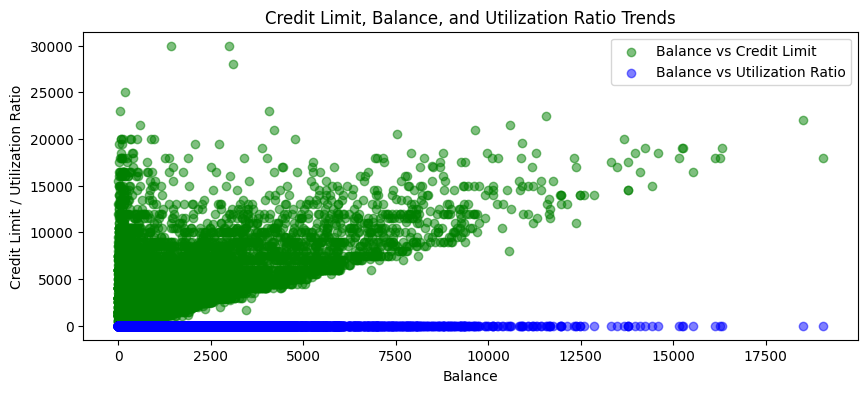

In [28]:
# Create a plot to visualize the trends between Balance, Credit Limit, and Utilization Ratio
plt.figure(figsize=(10, 4))

# Plot Balance vs Credit Limit
plt.scatter(df['BALANCE'], df['CREDIT_LIMIT'], color='green', alpha=0.5, label='Balance vs Credit Limit')

# Plot Balance vs Utilization Ratio
plt.scatter(df['BALANCE'], df['UTILIZATION_RATIO'], color='blue', alpha=0.5, label='Balance vs Utilization Ratio')

# Add titles and labels
plt.title('Credit Limit, Balance, and Utilization Ratio Trends')
plt.xlabel('Balance')
plt.ylabel('Credit Limit / Utilization Ratio')
plt.legend()

# Display the plot
plt.show()


After analyzing the relationship, Many customers have relatively low utilization ratios even at higher balance levels, indicating good credit management or sufficient credit limits. Customers with higher balances and higher utilization ratios would be closer to maxing out their credit limits and could represent a higher risk for financial institutions.

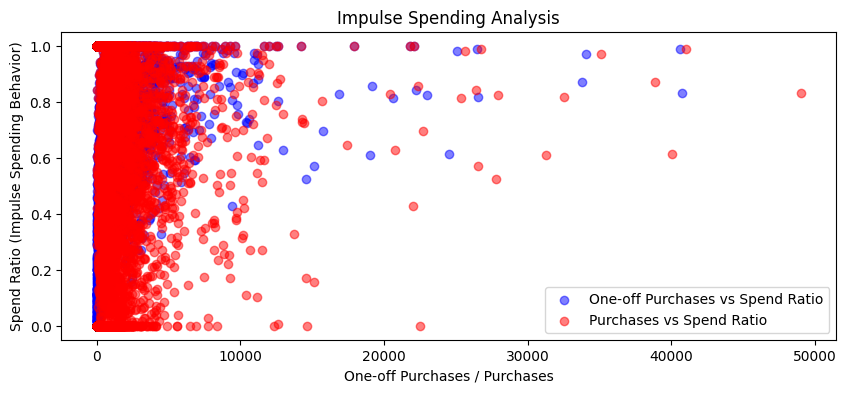

In [32]:
# create a graph to understand the relationship
plt.figure(figsize=(10, 4))

# Plot One-off Purchases vs Spend Ratio
plt.scatter(df['ONEOFF_PURCHASES'], df['SPEND_RATIO'], color='blue', alpha=0.5, label='One-off Purchases vs Spend Ratio')

# Plot Purchases vs Spend Ratio
plt.scatter(df['PURCHASES'], df['SPEND_RATIO'], color='red', alpha=0.5, label='Purchases vs Spend Ratio')

# Add titles and labels
plt.title('Impulse Spending Analysis')
plt.xlabel('One-off Purchases / Purchases')
plt.ylabel('Spend Ratio (Impulse Spending Behavior)')
plt.legend()

plt.show()

Here,The blue points near the top of the graph (spend ratio near 1) show that these customers' purchases are primarily made up of one-off purchases. These customers are likely to engage in impulsive buying behavior.Customers with higher spend ratios can be targeted for time-sensitive promotions or one-time offers, as they tend to engage in more impulsive purchases.Whereas,The red points near the bottom (spend ratio near 0) represent customers whose one-off purchases make up a smaller portion of their total purchases. Customers with low spend ratios are more likely to make planned purchases and may respond better to loyalty programs, subscriptions, or regular promotions.

 On average, customers spend $1,025.43, with a substantial standard deviation, indicating a wide range of spending habits. While 25% of customers do not make any one-off purchases, the median impulse spending ratio is 0.12, meaning half of the customers spend less than 12% of their total on one-off purchases. However, some customers make up to 87% of their purchases impulsively, as indicated by the 75th percentile. The data suggests diverse customer behaviors, with a notable portion engaging heavily in impulse buying, making it an important factor for targeted marketing strategies.

In [34]:
df['MINIMUM_PAYMENTS'].describe()

count     8636.000000
mean       864.304943
std       2372.566350
min          0.019163
25%        169.163545
50%        312.452292
75%        825.496463
max      76406.207520
Name: MINIMUM_PAYMENTS, dtype: float64

In [35]:
df[df['MINIMUM_PAYMENTS'] > 1750]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,...,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,PAYMENT_BEHAVIOR,UTILIZATION_RATIO,SPEND_RATIO
5,C10006,1809.828751,1.000000,1333.28,0.0,1333.28,0.000000,0.666667,0.000000,0.583333,...,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0.376696,1.000000,0.000000
10,C10011,1293.124939,1.000000,920.12,0.0,920.12,0.000000,1.000000,0.000000,1.000000,...,0,12,1200.0,1083.301007,2172.697765,0.000000,12,0.367095,1.000000,0.000000
15,C10016,6886.213231,1.000000,1611.70,0.0,1611.70,2301.491267,0.500000,0.000000,0.500000,...,4,11,8000.0,1993.439277,2109.906490,0.000000,12,0.485446,0.860777,0.000000
19,C10020,3577.970933,1.000000,398.64,0.0,398.64,0.000000,1.000000,0.000000,1.000000,...,0,12,4000.0,1053.980464,12465.549380,0.000000,12,0.003316,0.894493,0.000000
20,C10021,2016.684686,1.000000,176.68,0.0,176.68,0.000000,0.666667,0.000000,0.666667,...,0,8,2000.0,223.068600,13557.297260,0.000000,12,0.001270,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8724,C18961,3002.791004,1.000000,2463.00,2463.0,0.00,797.158950,0.166667,0.166667,0.000000,...,3,3,3000.0,431.716492,16638.733850,0.000000,12,0.000302,1.000000,1.000000
8754,C18993,455.471255,1.000000,389.70,44.7,345.00,276.902382,1.000000,0.083333,0.916667,...,4,14,1000.0,48.594194,3644.171310,0.090909,12,0.142120,0.455471,0.114704
8840,C19081,2588.410789,0.888889,787.40,0.0,787.40,3762.650329,0.777778,0.000000,0.666667,...,10,17,3000.0,1739.406636,1769.001229,0.000000,9,0.496301,0.862804,0.000000
8873,C19114,1023.883008,1.000000,585.84,0.0,585.84,956.849209,1.000000,0.000000,0.875000,...,2,22,1000.0,212.105443,2789.590897,0.000000,8,0.216066,1.000000,0.000000


<Axes: xlabel='MINIMUM_PAYMENTS', ylabel='Count'>

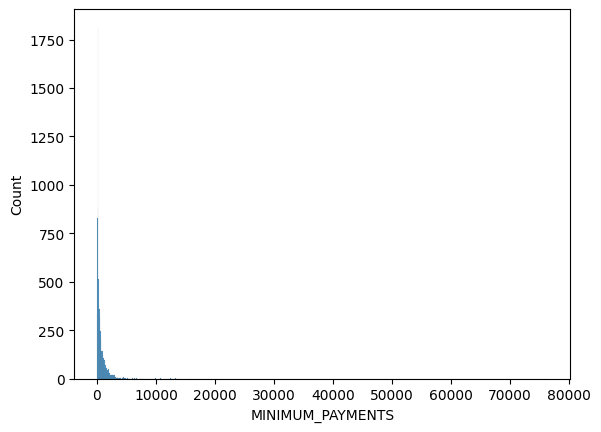

In [36]:
sns.histplot(df['MINIMUM_PAYMENTS'])

In [37]:
df['BALANCE'].describe()

count     8636.000000
mean      1601.224893
std       2095.571300
min          0.000000
25%        148.095189
50%        916.855459
75%       2105.195853
max      19043.138560
Name: BALANCE, dtype: float64

<Axes: xlabel='BALANCE', ylabel='Count'>

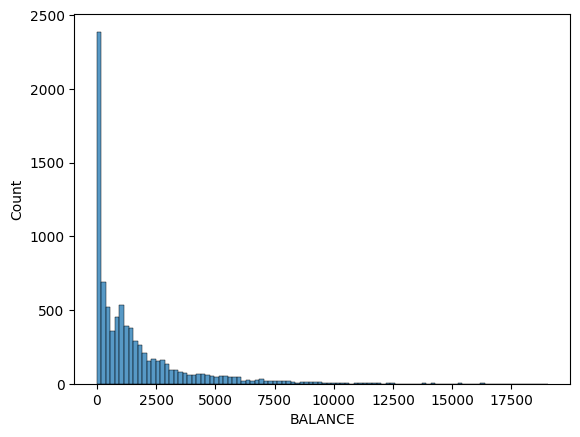

In [38]:
sns.histplot(df['BALANCE'])

In [39]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE', 'PAYMENT_BEHAVIOR',
       'UTILIZATION_RATIO', 'SPEND_RATIO'],
      dtype='object')

# Part 3 - Clustering Algorithms

## Model 1 - KMeans Clustering Algorithm

In [44]:
# Selecting the specified columns from cluster_df
selected_columns = [
    'BALANCE_FREQUENCY', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 
    'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 
    'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 
    'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'PRC_FULL_PAYMENT', 
    'TENURE', 'PAYMENT_BEHAVIOR', 'UTILIZATION_RATIO', 'SPEND_RATIO'
]

# Updating cluster_df
cluster_df = df[selected_columns]


In [45]:
#Step 1: Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(cluster_df)

# Step 2: Use the elbow method to find the optimal number of clusters
inertia = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)
inertia

[120904.0,
 98597.13099495455,
 87706.40972832282,
 79069.51311760907,
 74008.2393375762,
 67583.57786504077,
 62155.018855815084,
 57452.669175689654,
 53076.660022913085,
 51119.242293010815]

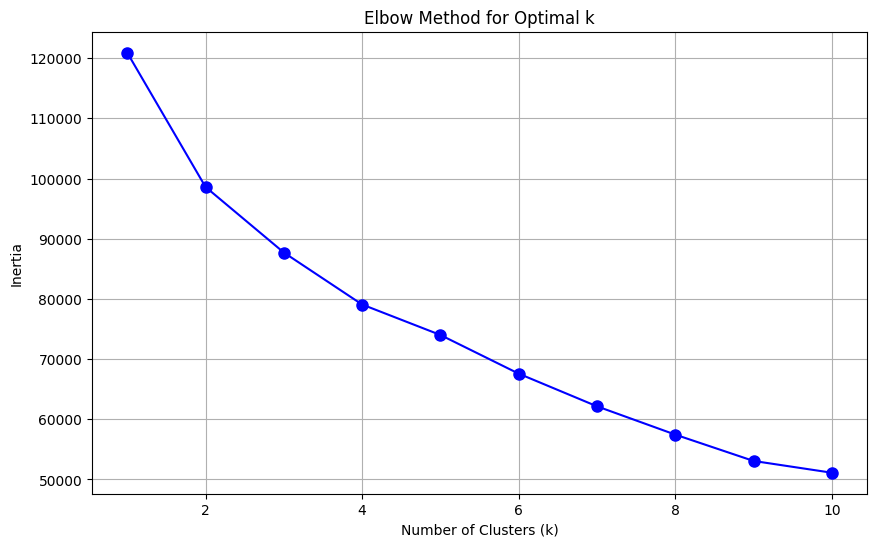

In [46]:
# Elbow method
plt.figure(figsize=(10, 6))
plt.plot(K, inertia, 'bo-', markersize=8)
plt.title("Elbow Method for Optimal k")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.grid(True)
plt.show()

Based on the Elbow Method, k = 3 is a suitable choice for the K-Means clustering of this dataset. This choice aligns well with the cluster interpretation, providing distinct and actionable segments that can guide business decisions for customer engagement and risk assessment.

/var/folders/yn/k940pt8148b_lkht2cptj7jh0000gn/T/ipykernel_82519/2320418147.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['Cluster'] = kmeans.labels_


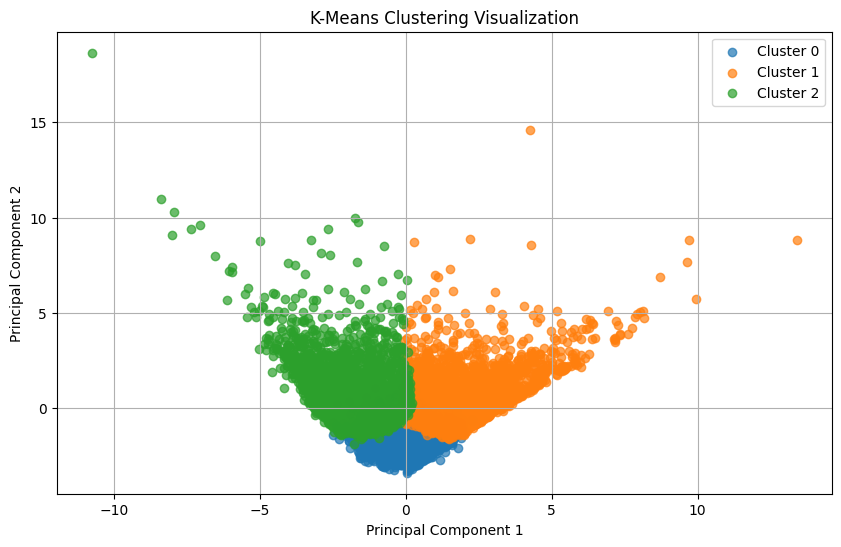

In [47]:
# Step 3: Perform k-means clustering with the chosen k
k = 3
kmeans = KMeans(n_clusters=k, random_state=0)
kmeans.fit(scaled_data)
cluster_df['Cluster'] = kmeans.labels_

# Step 4: Visualize the clusters using PCA for a 2D plot
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)
plt.figure(figsize=(10, 6))

# Scatter plot with color by cluster
for cluster in range(k):
    plt.scatter(pca_data[cluster_df['Cluster'] == cluster, 0], 
                pca_data[cluster_df['Cluster'] == cluster, 1], 
                label=f'Cluster {cluster}', alpha=0.7)

plt.title("K-Means Clustering Visualization")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid(True)
plt.show()

The scatter plot shows the K-Means clustering results for the credit card dataset, visualized with Principal Component Analysis (PCA). PCA is used here to reduce the high-dimensional data to two principal components, making it easier to see the structure of the clusters.

The plot displays three distinct clusters:

Cluster 0: Blue points
Cluster 1: Orange points
Cluster 2: Green points

Cluster Compactness and Variation:

Cluster 0’s compact structure could indicate low variability, suggesting customers in this group are likely to exhibit consistent, conservative behaviors.
The spread in Cluster 1 and Cluster 2 shows that these groups contain more diverse spending and credit behaviors. This diversity can be useful for creating segmented marketing campaigns targeting different financial behaviors. Hence, The K-Means model has effectively segmented the credit card customer base into three distinct groups:

Cluster 0 (low spenders, low risk)
Cluster 1 (diverse high/moderate spenders, varied risk)
Cluster 2 (moderate, responsible spenders)

## Model Evaluation - KMeans Clustering Algorithm

In [78]:


# Silhouette Analysis
silhouette_avg = silhouette_score(scaled_data, kmeans.labels_)
print(f"Average Silhouette Score: {silhouette_avg}")

# Davies-Bouldin Index (DBI)
dbi_score = davies_bouldin_score(scaled_data, kmeans.labels_)
print(f"Davies-Bouldin Index (DBI): {dbi_score}")

# Retrieve data for each cluster in separate DataFrames
kmeans_cluster_0_df = cluster_df[cluster_df['Cluster'] == 0].reset_index(drop=True)
kmeans_cluster_1_df = cluster_df[cluster_df['Cluster'] == 1].reset_index(drop=True)
kmeans_cluster_2_df = cluster_df[cluster_df['Cluster'] == 2].reset_index(drop=True)

Average Silhouette Score: 0.16546406714045583
Davies-Bouldin Index (DBI): 1.7846304524591303


Analysis:

-K-Means shows the highest Silhouette Score (0.165) compared to the other models, indicating moderate cluster separation. While the score isn't perfect, it suggests that clusters are reasonably well-defined.
-The DBI value of 1.78 is the lowest among the models, meaning the clusters are more compact and have better separation compared to the others.
-K-Means tends to work well when clusters are more spherical or evenly distributed, which can be ideal for a balanced customer segmentation strategy.

## Model 2 - Agglomerative Hierarchical Clustering Algorithm

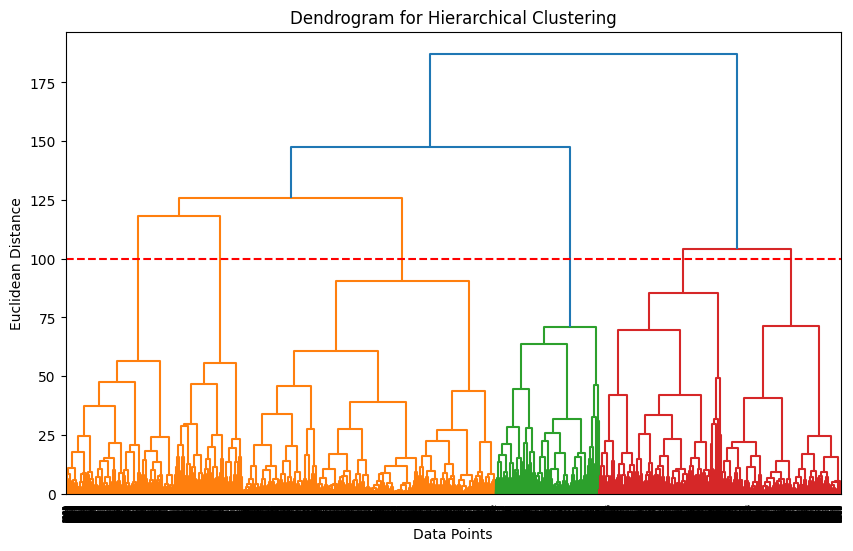

In [49]:

# Step 1: Plot Dendrogram to help determine the optimal number of clusters
linked = linkage(scaled_data, method='ward')
plt.figure(figsize=(10, 6))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)

threshold = 100  # Example threshold (this can be adjusted based on the visual inspection)
plt.axhline(y=threshold, color='r', linestyle='--', label='Threshold')

plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Euclidean Distance")
plt.show()

The dendrogram provides a visual representation of the Agglomerative Hierarchical Clustering process. It shows how individual data points or clusters are merged together based on their Euclidean distance, forming a tree-like structure. The y-axis (Euclidean Distance) shows the distance or dissimilarity between clusters as they are merged.
The reason why we selected the threshold line as 100 is because we considered the maximum vertical depth in the dendrogram plot to identify the optimal number of clusters.

At this level, we can observe three main clusters below the threshold line:
Cluster 1 (left side, orange)
Cluster 2 (middle, green)
Cluster 3 (right side, red)
This is consistent with the elbow method result for K-means, where k = 3 was identified as the optimal number of clusters.
The horizontal red threshold line in the dendrogram indicates a potential cut-off point, which helps in determining the number of clusters.

In [50]:
# Step 2: Perform Agglomerative Hierarchical Clustering with chosen number of clusters
k = 3
agg_cluster = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
cluster_labels = agg_cluster.fit_predict(scaled_data)
cluster_df['Cluster'] = cluster_labels

/var/folders/yn/k940pt8148b_lkht2cptj7jh0000gn/T/ipykernel_82519/4149382143.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['Cluster'] = cluster_labels


In [51]:
cluster_labels

array([0, 2, 0, ..., 0, 0, 0])

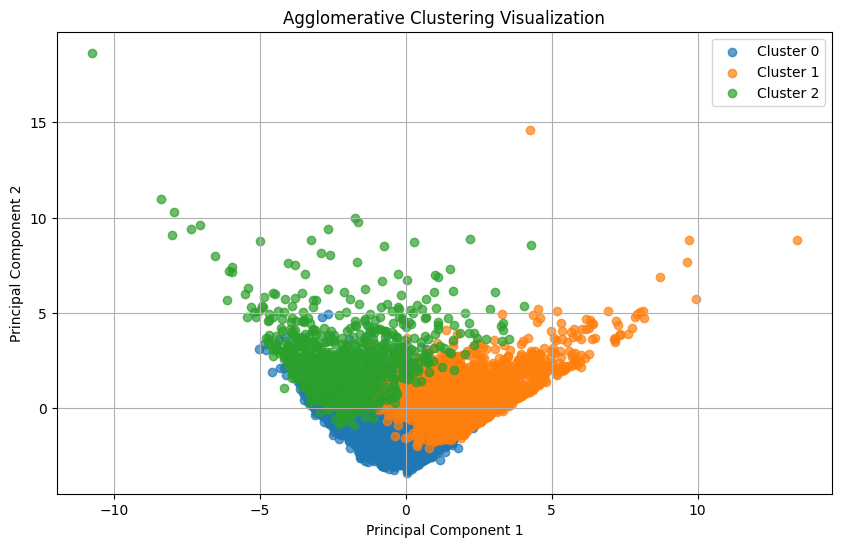

In [52]:
# Step 1: Perform PCA for 2D visualization
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)

# Step 2: Plot clusters
plt.figure(figsize=(10, 6))
for cluster in range(k):  # Loop over each cluster
    plt.scatter(
        pca_data[cluster_df['Cluster'] == cluster, 0], 
        pca_data[cluster_df['Cluster'] == cluster, 1], 
        label=f'Cluster {cluster}', 
        alpha=0.7
    )

# Plot settings
plt.title("Agglomerative Clustering Visualization")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid(True)
plt.show()


This visualization shows the Agglomerative Clustering results for the credit card dataset, with the clusters represented in two dimensions through Principal Component Analysis (PCA).

Cluster Distribution and Separation:

Cluster 1 (Orange): This cluster has a wide spread along the Principal Component 1 (x-axis), similar to what was observed in K-Means. This broad distribution suggests that Cluster 1 includes highly diverse spending and credit behaviors.

Cluster 2 (Green): This cluster also appears spread across both principal components, indicating that it contains customers with balanced spending and payment patterns. Like K-Means, it likely represents moderate spenders who make regular payments.

Cluster 0 (Blue): Positioned near the bottom of the plot, Cluster 0 is more compact and displays a consistent, conservative behavior among its members. It likely represents low-risk, low-spending customers.

## Model Evaluation - Agglomerative Hierarchical Clustering Algorithm

In [53]:
# Step 3: Silhouette Analysis
silhouette_avg = silhouette_score(scaled_data, cluster_labels)
print(f"Average Silhouette Score: {silhouette_avg}")

# Step 4: Davies-Bouldin Index (DBI)
dbi_score = davies_bouldin_score(scaled_data, cluster_labels)
print(f"Davies-Bouldin Index (DBI): {dbi_score}")

# Step 5: Retrieve data for each cluster in separate DataFrames
cluster_0_df = cluster_df[cluster_df['Cluster'] == 0].reset_index(drop=True)
cluster_1_df = cluster_df[cluster_df['Cluster'] == 1].reset_index(drop=True)
cluster_2_df = cluster_df[cluster_df['Cluster'] == 2].reset_index(drop=True)

Average Silhouette Score: 0.15059200295402964
Davies-Bouldin Index (DBI): 1.9331368482290028


Analysis:

The Silhouette Score of 0.150 in Agglomerative Hierrarchical Clustering is slightly lower than K-Means, indicating that cluster separation is not as good.
The DBI of 1.93 is higher than K-Means, indicating that clusters are not as compact, suggesting overlap or less distinct separation between clusters.
However, due to the lower cluster compactness and lower separation compared to K-Means, this model might be less practical for broad customer segmentation.

## Model 3 - DBSCAN Clustering Algorithm

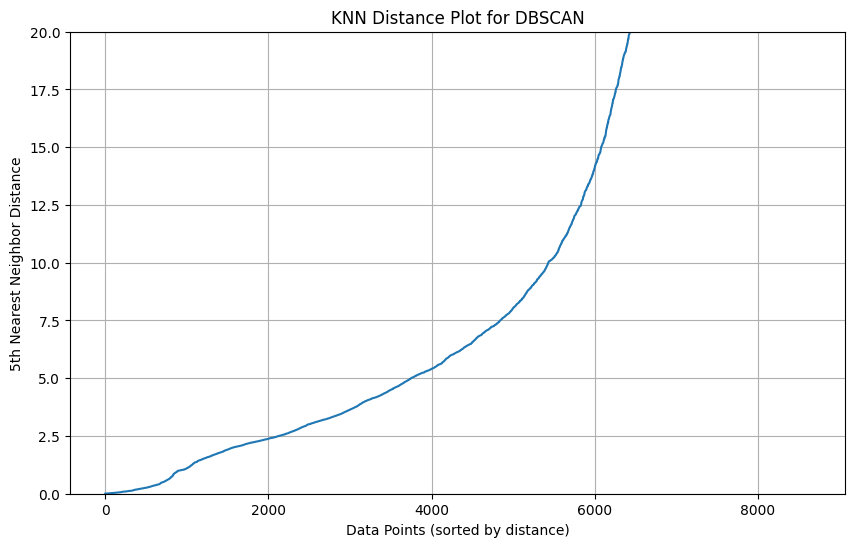

In [59]:
# Step 1: Determine optimal epsilon using K-Nearest Neighbors (KNN) plot
# Fit the nearest neighbors model to find the distances
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(cluster_df.iloc[:, :-1])  # Using all features except the Cluster label
distances, indices = neighbors_fit.kneighbors(cluster_df.iloc[:, :-1])

# Sort distances and plot the KNN distance plot to identify the "elbow"
distances = np.sort(distances[:, 4])  # Taking the 5th nearest neighbor distance
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.ylim(0, 20)
plt.title("KNN Distance Plot for DBSCAN")
plt.xlabel("Data Points (sorted by distance)")
plt.ylabel("5th Nearest Neighbor Distance")
plt.grid(True)
plt.show()


The KNN (k-nearest neighbors) Distance Plot helps determine the optimal value of epsilon for the DBSCAN clustering algorithm. 
Given the small neighborhood size (eps=0.5), clusters may not be well-defined, leading to a low Silhouette Score and high Davies-Bouldin Index. This indicates poor clustering performance, with clusters that lack compactness and separation.

As we observed a slight curve at values close to 0. Therefore, we selected an epsilon value of 0.50 for our DBSCAN clustering algorithm.


## Model Evaluation - DBSCAN Clustering Algorithm

In [71]:
# Step 1: Perform DBSCAN with the chosen epsilon value from the KNN plot
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(cluster_df.iloc[:, :-1])

# Step 2: Add the DBSCAN cluster labels to the DataFrame
cluster_df['Cluster'] = dbscan_labels

# Step 3: Evaluate DBSCAN using Silhouette Score and Davies-Bouldin Index
silhouette_avg = silhouette_score(scaled_data, dbscan_labels)
print(f"Average Silhouette Score: {silhouette_avg}")

# Step 4: Davies-Bouldin Index (DBI)
dbi_score = davies_bouldin_score(scaled_data, dbscan_labels)
print(f"Davies-Bouldin Index (DBI): {dbi_score}")


/var/folders/yn/k940pt8148b_lkht2cptj7jh0000gn/T/ipykernel_82519/2766635440.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['Cluster'] = dbscan_labels


Average Silhouette Score: -0.3043576348641763
Davies-Bouldin Index (DBI): 4.594151454147299


Analysis: 

A negative Silhouette Score of -0.304 is concerning and suggests that many points are likely misclassified or located near the boundary of clusters. DBSCAN may have failed to capture meaningful structure in this dataset.
The high DBI of 4.59 further suggests that the clusters are very dispersed, and the model may have struggled to group points into well-defined clusters. However, the model’s poor performance metrics make it less suitable for standard customer segmentation. It may not produce reliable clusters for marketing or business strategy.

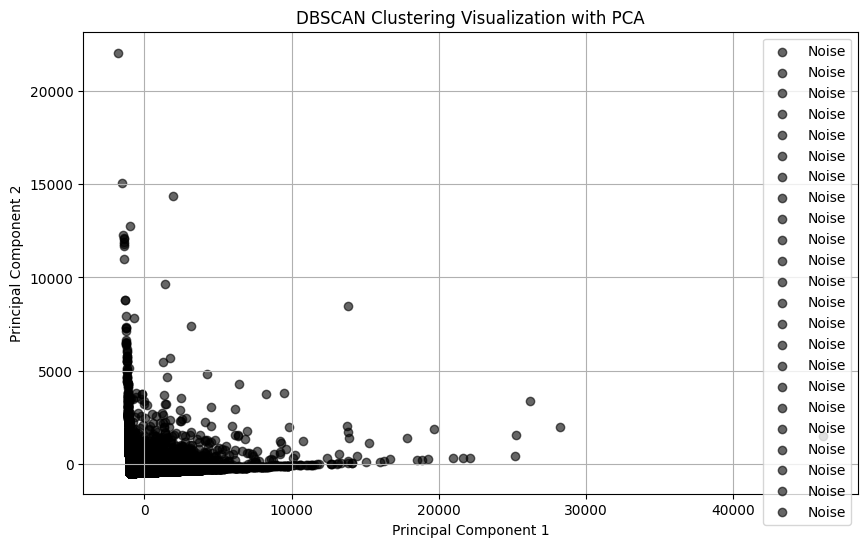

In [72]:
# Step 5: Visualize the DBSCAN clustering using PCA for a 2D plot

# Perform PCA for 2D visualization
pca = PCA(n_components=2)
pca_data_dbscan = pca.fit_transform(cluster_df.iloc[:, :-1])

# Plot the DBSCAN clusters with noise
plt.figure(figsize=(10, 6))
unique_labels = np.unique(dbscan_labels)

for label in unique_labels:
    # Plot noise points in black
    plt.scatter(pca_data_dbscan[dbscan_labels == label, 0], 
                pca_data_dbscan[dbscan_labels == label, 1], 
                color='black', label='Noise', alpha=0.6)

plt.title("DBSCAN Clustering Visualization with PCA")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid(True)
plt.show()


Majority of the data points are labeled as "Noise" (represented by the gray color), indicating that DBSCAN did not identify any dense clusters in this dataset with the chosen epsilon value.The wide spread could imply that the dataset contains heterogeneous patterns in credit card usage.

If DBSCAN consistently labels all points as noise, consider other clustering algorithms. K-Means and other clustering methods might be more effective in capturing distinct customer segments in this dataset.

In [73]:
# Count the number of points in each cluster (including noise, labeled as -1)
cluster_counts = cluster_df['Cluster'].value_counts()

# Displaying the count of each cluster, including the noise points
cluster_counts


Cluster
-1     7872
 1      234
 5      108
 0       58
 6       57
 2       50
 7       44
 12      36
 3       30
 8       23
 14      20
 4       19
 9       15
 13      14
 10      13
 11       7
 15       6
 16       6
 17       5
 18       5
 20       5
 21       5
 19       4
Name: count, dtype: int64

## Model 4 - Spectral Clustering Algorithm

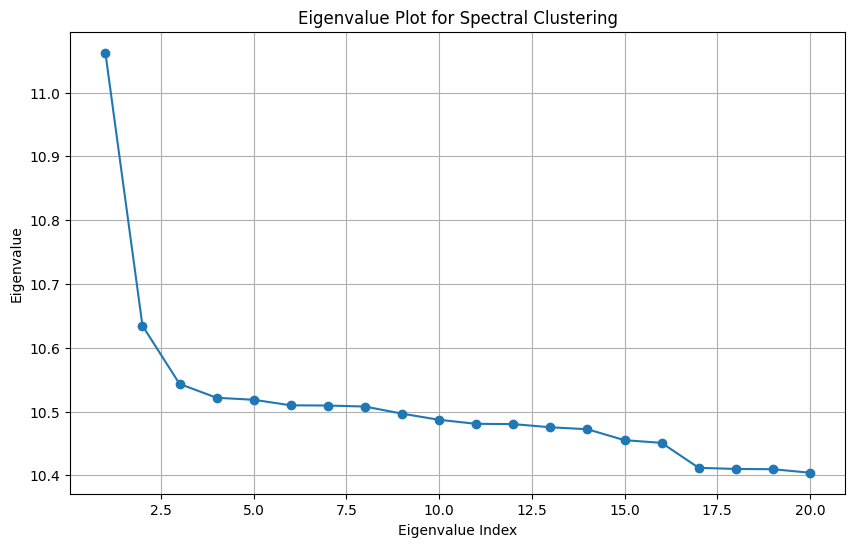

In [75]:
# Step 1: Compute the Laplacian matrix for the data using a nearest-neighbors graph
# Using a 10-nearest neighbors graph as commonly used in spectral clustering
knn_graph = kneighbors_graph(scaled_data, n_neighbors=10, include_self=True)
laplacian_matrix = knn_graph - knn_graph.mean(axis=0)  # Centering for spectral analysis

# Step 2: Compute the eigenvalues of the Laplacian matrix
# Extract the largest 20 eigenvalues to plot
eigenvalues, _ = eigsh(laplacian_matrix, k=20, which='LA')  # 'LA' for largest algebraic

# Step 3: Plot the eigenvalues to identify the optimal number of clusters
plt.figure(figsize=(10, 6))
plt.plot(range(1, 21), sorted(eigenvalues, reverse=True), marker='o')
plt.title("Eigenvalue Plot for Spectral Clustering")
plt.xlabel("Eigenvalue Index")
plt.ylabel("Eigenvalue")
plt.grid(True)
plt.show()


This plot shows the eigenvalues for Spectral Clustering, an approach that utilizes the eigenvalues of a graph's similarity matrix to partition data into clusters.

In this plot, the "elbow" appears around index 3, suggesting that 3 clusters might be optimal. This is the point where the rate of decrease slows, indicating that additional clusters may add less distinct separation between groups.


/var/folders/yn/k940pt8148b_lkht2cptj7jh0000gn/T/ipykernel_82519/2031409599.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['Cluster'] = spectral_labels


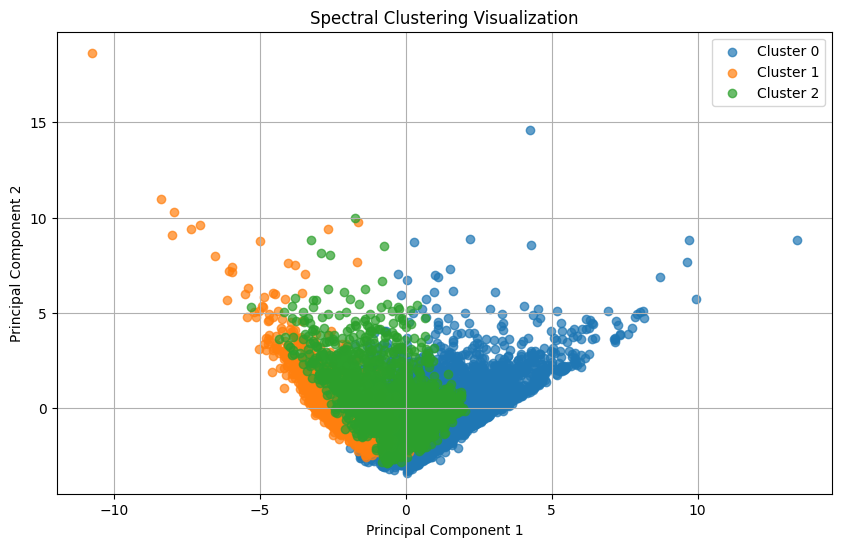

(0.1580303268489584, 2.0028504135621064)

In [74]:
# Step 1: Perform Spectral Clustering with the chosen number of clusters (k=3)
k = 3
spectral_cluster = SpectralClustering(n_clusters=k, affinity='nearest_neighbors', random_state=0)
spectral_labels = spectral_cluster.fit_predict(scaled_data)

# Add the spectral cluster labels to `cluster_df`
cluster_df['Cluster'] = spectral_labels

# Step 2: Visualize the clusters using PCA for a 2D plot
pca_data = pca.fit_transform(scaled_data)  # Assuming PCA was already imported and initialized

plt.figure(figsize=(10, 6))
for cluster in range(k):
    plt.scatter(pca_data[cluster_df['Cluster'] == cluster, 0],
                pca_data[cluster_df['Cluster'] == cluster, 1],
                label=f'Cluster {cluster}', alpha=0.7)

plt.title("Spectral Clustering Visualization")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid(True)
plt.show()

Cluster 0 (Blue) appears to capture diverse spending patterns, potentially containing high-spending and varied-usage customers.
Cluster 1 (Orange), with its compact distribution, likely represents consistent behaviors, possibly conservative spenders or customers with stable credit usage patterns.
Cluster 2 (Green) represents an intermediate segment with balanced behaviors, potentially capturing moderate spending and repayment habits.

Spectral Clustering, with three clusters, aligns well with previous findings and provides distinct, interpretable segments:

Cluster 0: Diverse spenders with a broad range of behaviors.
Cluster 1: Stable, conservative customers with homogeneous behaviors.
Cluster 2: Moderate users with balanced spending patterns.


## Model Evaluation - Spectral Clustering Algorithm

In [97]:
# Silhouette Analysis
silhouette_avg = silhouette_score(scaled_data, spectral_labels)
print(f"Average Silhouette Score: {silhouette_avg}")

# Davies-Bouldin Index (DBI)
dbi_score = davies_bouldin_score(scaled_data, spectral_labels)
print(f"Davies-Bouldin Index (DBI): {dbi_score}")

Average Silhouette Score: 0.018447555605042087
Davies-Bouldin Index (DBI): 5.743973779795401


Analysis: 

The Silhouette Score (0.158) in Spectral method is close to K-Means, but slightly lower. This indicates moderate separation, but the clusters may not be as well-defined as in K-Means. The DBI of 2.00 is higher than K-Means, suggesting the clusters are not as compact or distinct. There may be some overlap or dispersion between clusters. If our customer data has non-linear patterns, Spectral clustering might better capture those. Spectral clustering may not be the best option for customer segmentation where clear, distinct clusters are desired.

In [79]:
kmeans_cluster_0_df

,BALANCE_FREQUENCY,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,PRC_FULL_PAYMENT,TENURE,PAYMENT_BEHAVIOR,UTILIZATION_RATIO,SPEND_RATIO,Cluster
0,0.818182,95.40,0.000000,0.166667,0.0,0.083333,0.000000,0,2,0.00,12,0.507786,0.040901,0.000000,0
1,1.000000,1333.28,0.000000,0.666667,0.0,0.583333,0.000000,0,8,0.00,12,0.376696,1.000000,0.000000,0
2,1.000000,688.38,0.000000,1.000000,1.0,1.000000,0.000000,0,64,1.00,12,0.955981,0.046464,0.902922,0
3,1.000000,436.20,0.000000,1.000000,0.0,1.000000,0.000000,0,12,0.00,12,0.518371,0.792892,0.000000,0
4,1.000000,920.12,0.000000,1.000000,0.0,1.000000,0.000000,0,12,0.00,12,0.367095,1.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4154,1.000000,591.24,0.000000,1.000000,0.0,0.833333,0.000000,0,6,1.00,6,0.548937,0.130839,0.000000,0
4155,0.833333,214.55,8555.409326,0.833333,0.0,0.666667,0.666667,13,5,0.00,6,0.513029,0.663053,0.000000,0
4156,1.000000,113.28,0.000000,1.000000,0.0,0.833333,0.000000,0,6,0.25,6,0.501026,0.040830,0.000000,0
4157,1.000000,291.12,0.000000,1.000000,0.0,0.833333,0.000000,0,6,0.50,6,0.534533,0.028494,0.000000,0


K-Means appears to be the better choice here for the following reasons:

The clusters formed were distinct, well-defined (that are easier to interpret) and had low computational efficiency, making it more scalable for large datasets like those in credit card analysis.


Spectral Clustering could still be useful if the goal is to explore underlying patterns or if the dataset exhibits highly non-linear structures that K-Means cannot capture. However, given the overlap and less distinct boundaries in Spectral Clustering, it may not be as effective for straightforward segmentation.

In summary, K-Means is the best choice moving forward, as our goal is to create actionable, clearly segmented customer groups based on spending and payment behaviors.

# Part 4 - Interpretating Clusters


### Feature Importance

#### KMeans clustering is our best clustering algorithm based on the Silhouette and DBI Scores. Using ANOVA Test we have categorized our variables and understood the Top 5 features using the p-values and this helped us analyze our independent variables better and interpret these features to be considered while modelling our clustering algorithm.

In [84]:
# Perform ANOVA test for each feature to identify significant differences between clusters
anova_results = {}
for feature in cluster_df.columns[:-1]:  # Exclude the 'Cluster' column
    groups = [cluster_df[cluster_df['Cluster'] == i][feature] for i in range(k)]
    anova_results[feature] = f_oneway(*groups).pvalue

# Convert ANOVA results to a DataFrame for easier interpretation
anova_df = pd.DataFrame(list(anova_results.items()), columns=['Feature', 'P-Value'])
significant_features = anova_df[anova_df['P-Value'] < 0.05]  # Features with p-value < 0.05

# Display significant features
print("Features based on ANOVA (p < 0.05):")
print(significant_features)


Features based on ANOVA (p < 0.05):
                             Feature        P-Value
0                  BALANCE_FREQUENCY   8.938439e-18
1             INSTALLMENTS_PURCHASES   0.000000e+00
2                       CASH_ADVANCE  1.310446e-236
3                PURCHASES_FREQUENCY   0.000000e+00
4         ONEOFF_PURCHASES_FREQUENCY   0.000000e+00
5   PURCHASES_INSTALLMENTS_FREQUENCY   0.000000e+00
6             CASH_ADVANCE_FREQUENCY   0.000000e+00
7                   CASH_ADVANCE_TRX  9.138552e-229
8                      PURCHASES_TRX   0.000000e+00
9                   PRC_FULL_PAYMENT   0.000000e+00
10                            TENURE   2.252945e-08
11                  PAYMENT_BEHAVIOR   1.605064e-39
12                 UTILIZATION_RATIO   0.000000e+00
13                       SPEND_RATIO   0.000000e+00


/Users/priyalgohel/Library/Python/3.9/lib/python/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


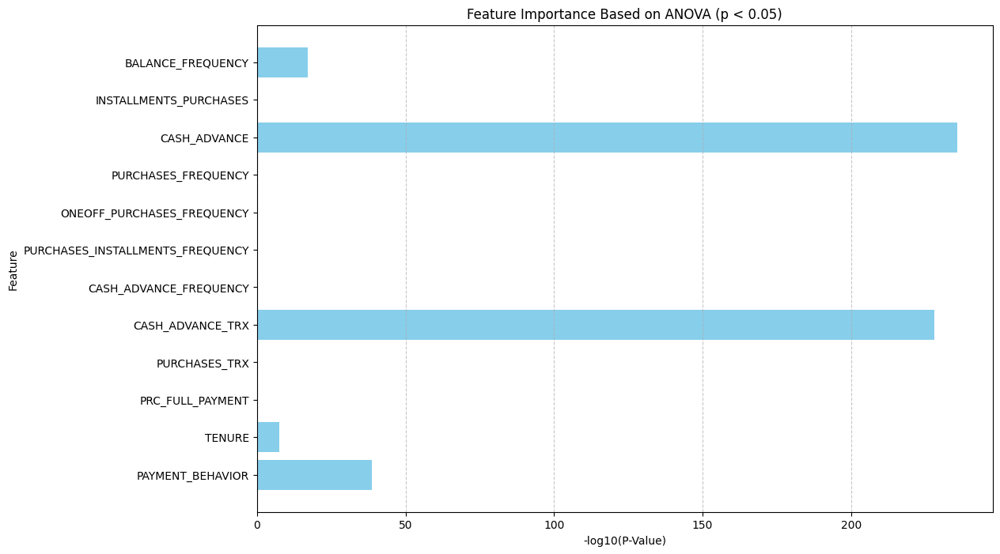

In [85]:
# Convert p-values to -log10 scale for better visualization (lower p-value -> higher importance)
significant_features['Importance'] = -np.log10(significant_features['P-Value'])

# Plot feature importance
plt.figure(figsize=(12, 8))
plt.barh(significant_features['Feature'], significant_features['Importance'], color='skyblue')
plt.xlabel("-log10(P-Value)")
plt.ylabel("Feature")
plt.title("Feature Importance Based on ANOVA (p < 0.05)")
plt.gca().invert_yaxis()  # Invert y-axis for descending order
plt.grid(True, axis='x', linestyle='--', alpha=0.7)
plt.show()

### Top 5 Features:
#### As per our feature importance plot, 'BALANCE_FREQUENCY', 'CASH_ADVANCE', 'CASH_ADVANCE_TRX', 'TENURE' and 'PAYMENT_BEHAVIOR' are the top 5 features

### Best Modelling Technique
#### The KMeans Clustering Algorithm evaluation shows a Silhouette Score of 0.165 and a Davies-Bouldin Index (DBI) of 1.78. The low Silhouette Score (closer to 0) indicates that the clusters may not be well-separated, suggesting some overlap or ambiguity between clusters. The DBI value, while moderate, suggests that the clusters are somewhat distinct but could benefit from further refinement. Overall, these scores imply that the clustering structure captures some differentiation but may not fully separate customer groups.

#### Based on these analysis, we have usd the top 5 features gained from feature importance graph and modeled our KMeans Clustering Algorithm based on these 5 features as the other features used in the previous model had little to no contribution while creating the clusters which hampered our cluster formation as well as impacted our Silhouette Score and DBI Index.

#### By Modelling our KMeans Clustering Algorithm on the top 5 features we can ensure that no features are unwanted and not essential to our clustering algorithms and this will help us enhance our clusters as well as improve our scores to peform better credit card customer segmentation and create distinct clusters.

## Best Model - KMeans Clustering Algorithm (using Top 5 features)

In [87]:
# Selecting the important feature columns from cluster_df
selected_columns = [
    'BALANCE_FREQUENCY', 'CASH_ADVANCE', 'CASH_ADVANCE_TRX',
    'TENURE', 'PAYMENT_BEHAVIOR']

# Updating cluster_df
feature_df = df[selected_columns]


In [88]:
#Step 1: Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(feature_df)

# Step 2: Use the elbow method to find the optimal number of clusters
inertia = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)
inertia

[43180.0,
 35743.56650359066,
 27152.811606479034,
 20525.947290021075,
 18069.065074157515,
 14796.928756727455,
 13505.950471232623,
 12653.008367262693,
 11531.185974391205,
 11052.530655724433]

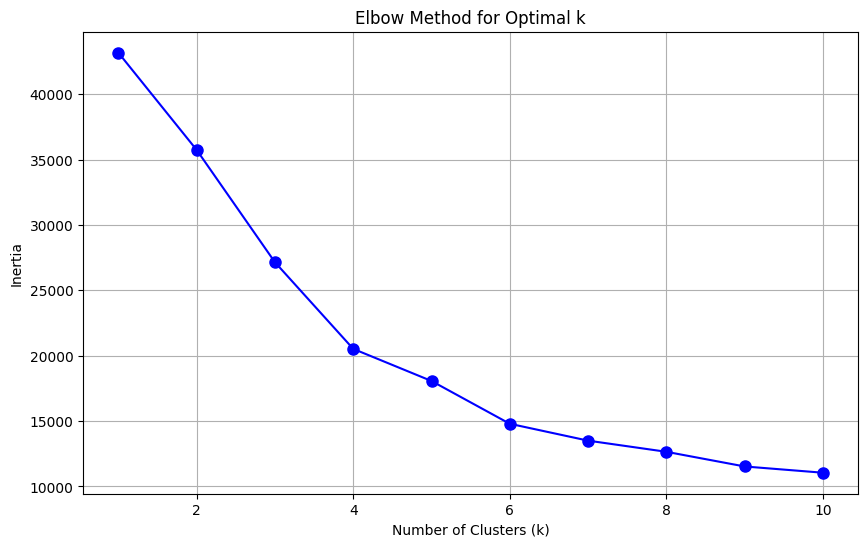

In [89]:
# Elbow method
plt.figure(figsize=(10, 6))
plt.plot(K, inertia, 'bo-', markersize=8)
plt.title("Elbow Method for Optimal k")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.grid(True)
plt.show()

#### Based on the elbow method we can see a clear change in the direction of the slope at X = 4 (Number of clusters) showing that the curve flattens out and there is less variation for values between 4 and 10. Hence using this plot have identified that 4 number of clusters are optimal for this KMeans Clustering Algorithm. 

/var/folders/yn/k940pt8148b_lkht2cptj7jh0000gn/T/ipykernel_82519/210241492.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['Cluster'] = kmeans.labels_


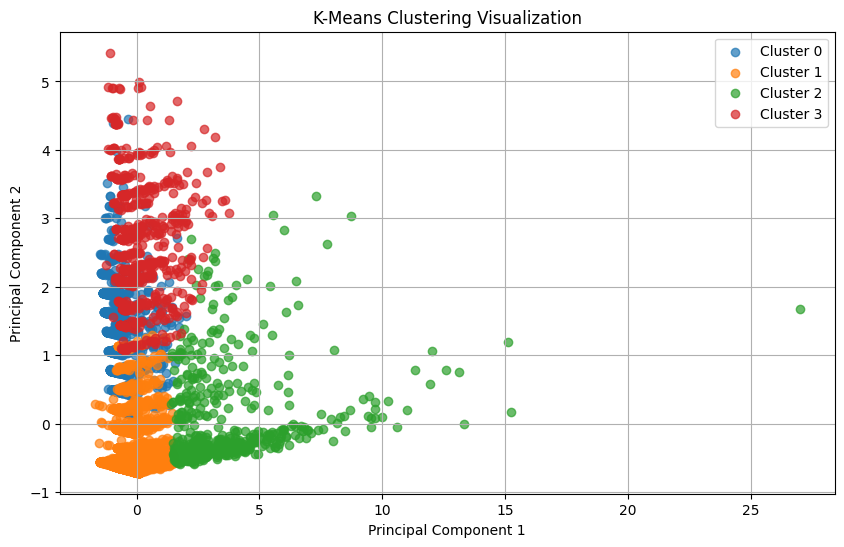

In [92]:
# Step 3: Perform k-means clustering with the chosen k
k = 4
kmeans = KMeans(n_clusters=k, random_state=0)
kmeans.fit(scaled_data)
cluster_df['Cluster'] = kmeans.labels_

# Step 4: Visualize the clusters using PCA for a 2D plot
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)
plt.figure(figsize=(10, 6))

# Scatter plot with color by cluster
for cluster in range(k):
    plt.scatter(pca_data[cluster_df['Cluster'] == cluster, 0], 
                pca_data[cluster_df['Cluster'] == cluster, 1], 
                label=f'Cluster {cluster}', alpha=0.7)

plt.title("K-Means Clustering Visualization")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid(True)
plt.show()

## Model Evaluation - KMeans Clustering Algorithm (using Top 5 features)

In [94]:
# Silhouette Analysis
silhouette_avg = silhouette_score(scaled_data, kmeans.labels_)
print(f"Average Silhouette Score: {silhouette_avg}")

# Davies-Bouldin Index (DBI)
dbi_score = davies_bouldin_score(scaled_data, kmeans.labels_)
print(f"Davies-Bouldin Index (DBI): {dbi_score}")

# Retrieve data for each cluster in separate DataFrames
kmeans_cluster_0_df = cluster_df[cluster_df['Cluster'] == 0].reset_index(drop=True)
kmeans_cluster_1_df = cluster_df[cluster_df['Cluster'] == 1].reset_index(drop=True)
kmeans_cluster_2_df = cluster_df[cluster_df['Cluster'] == 2].reset_index(drop=True)
kmeans_cluster_3_df = cluster_df[cluster_df['Cluster'] == 3].reset_index(drop=True)

Average Silhouette Score: 0.4651968302345784
Davies-Bouldin Index (DBI): 0.9456819516243323


In [96]:
# Concatenate the DataFrames
kmeans_cluster_df = pd.concat([kmeans_cluster_0_df, kmeans_cluster_1_df, kmeans_cluster_2_df, kmeans_cluster_3_df], ignore_index=True)
kmeans_cluster_df['Cluster'].value_counts()

Cluster
1    6108
0    1127
2     738
3     663
Name: count, dtype: int64

#### In comparison with our previous KMeans Clustering Algorithm this Kmeans Clustering Algorithm performs better ad provoides better results 
#### The KMeans Clustering Algorithm with an Average Silhouette Score of 0.465 and a Davies-Bouldin Index (DBI) of 0.946 indicates moderately well-defined clusters. The Silhouette Score, closer to 0.5, suggests reasonable separation and cohesion within clusters. The lower DBI value (<1) reflects well-separated clusters, indicating that the clustering structure effectively distinguishes customer groups. Overall, these metrics suggest a good clustering result, with clear groupings and minimal overlap.

##  Customer Segementation:

### 1. Blue Cluster - Low Activity Spending Customers (1127 Credit Card Customers)
#### Cluster Position: Cluster 0 is positioned lower in the PCA space and is relatively compact.
#### Interpretation: Customers in this cluster likely have low spending and low usage patterns, potentially indicating minimal engagement with their credit cards.
#### Characteristics: They may make few purchases, pay off balances quickly, or use their cards for only essential or limited transactions.

### 2. Orange Cluster - Minimal Activity Spending Customers (6108 Credit Card Customers)
#### Cluster Position: Cluster 1 is positioned lower along the first principal component with a distinct and compact spread, indicating minimal engagement or very low usage patterns.
#### Interpretation: These customers are likely minimal spenders who use their credit cards sparingly, perhaps only for specific, infrequent purchases or emergencies. Their low engagement suggests that they are not heavily reliant on their credit cards.
#### Characteristics: This group may include customers who maintain their credit cards primarily for emergencies or specific use cases, like occasional online shopping or travel.

### 3. Green Cluster - High Activity Spending Customers (738 Credit Card Customers)
#### Cluster Position: Cluster 2 is spread widely along the right side, indicating diverse spending behavior.
#### Interpretation: This cluster likely represents high-spending, high-activity customers 
#### Characteristics: These customers might use their credit cards frequently, have high purchase volumes, and might not always pay their balance in full.

### 4. Red Cluster - Moderate Activity Spending Customers (663 Credit Card Customers)
#### Cluster Position: Cluster 3 is centered and has moderate spread, indicating average spending and usage patterns.
#### Interpretation: These customers likely have moderate credit card activity, balancing usage between necessities and occasional spending
#### Characteristics: They may occasionally carry balances and might engage in installment-based purchases.

# Part 5 - Actionable Insights

### Targeting customers from the Orange (Minimal Activity Spending) and Green (High Activity Spending) clusters is strategically valuable for the following reasons:

### 1. Orange Cluster - Minimal Activity Spending Customers:

#### With 6,108 customers, this is the largest segment, representing significant untapped potential. Although these customers currently use their cards sparingly, they can be encouraged to increase activity with targeted incentives, such as rewards on essential categories or occasional fee waivers. By boosting engagement even slightly, this segment can generate more revenue and build long-term loyalty, especially if they start to see the card as valuable for routine spending.

### 2. Green Cluster - High Activity Spending Customers:

#### The Green Cluster comprises 738 high-value, high-activity customers who already generate substantial transaction volumes. These customers are likely highly engaged and may carry balances, creating consistent revenue from interest and transaction fees. Retaining and rewarding this group with premium offers and loyalty benefits is crucial, as they represent a profitable base. Increasing their satisfaction and loyalty can prevent attrition, ensuring that they continue to bring high returns to the business.


## Business Recommendations for Minimal Activity Spending Customers
### 1. Low or No Annual Fees
#### Provide a no annual fee option or a fee waiver for customers in this segment to eliminate cost barriers and encourage card usage. This approach not only makes the card more appealing but also incentivizes more customers to apply and stay active without the worry of additional fees. 

#### Marketing Method:
#### a. Direct Email Campaigns: Send personalized emails explaining the benefits of the fee waiver.
#### b. App Notifications: In-app reminders to promote newer credit cards products.


### 2. Cashback and Rewards on Essential Categories
#### Provide periodic rewards, such as 3% cashback for the first $100 spent in these categories each month as well as 2-5% cashback on groceries, fuel, mobile bill payments and restaurant bills. Offer 1% cashback in the form of points for every dollar spent, redeemable for statement credits, gift cards, or merchandise.

#### Marketing Method:
#### a. Quarterly Email Reminders: Send reminders at the start of each quarter, highlighting potential savings.
####    Example: “Earn 3% Cashback on Groceries and Gas!”
#### b. SMS Alerts: Use SMS to notify customers of upcoming rewards periods, with a link to activate the offer.
#### c. Push Notifications: Notify customers when they reach certain point milestones, encouraging them to redeem.

### 3. Cash Incentives for Referrals
#### Provide a $10 cash reward for each referral, credited to the cardholder’s account once the referred person activates their card.

#### Marketing Method:
#### 1. Referral Link in App: Create a personalized referral link for each customer in the app, with messages like, “Earn $10 for Every Friend Who Joins!”
#### 2. Social Media Integration: Encourage customers to share referral links on social media with a post generator in the app, helping them promote it easily to friends and family.
#### 3. In store QR Codes: Incentivize customers to use the QR codes to join the credit card program and enjoy various monetary benefits

## Business Recommendations for High Activity Spending Customers

#### 1. Exclusive Benefits and Perks
#### Include benefits like complimentary lounge access, free travel insurance, restaurant perks and a 24/7 personal concierge for booking and reservations.

#### Marketing Method:
#### a. Targeted Social Media Ads: Create visually appealing ads showcasing lounge access, travel and restaurant perks, targeted for lifestyle-focused customers.
#### b. Direct Mail: Send a premium welcome kit that details exclusive benefits, emphasizing the luxury and value offered by the card.

#### 2. Flexible Payment Options with Low-Interest Installments
#### Offer 0% APR on installment plans for 6-12 months on purchases over $500, or provide an option to convert larger balances into low-interest monthly payments.

#### Marketing Method:
#### a. SMS Notifications: Send timely SMS notifications when a purchase qualifies for an installment plan.
#### Example: “Split Your Purchase Into Easy Payments!”
#### b. In-App Promotions: Display in-app banners promoting installment plans, especially around major shopping events and holidays.

#### 3. Loyalty Program with Tiered Benefits
#### Create loyalty tiers (e.g., Silver, Gold, Platinum) that grant progressively better rewards and perks, such as extra cashback, travel upgrades, and annual bonuses.

#### Marketing Method:
#### a. Monthly Progress Emails: Send emails that show customers how close they are to the next tier, encouraging increased spending to unlock new rewards.
#### b. In-App Loyalty Status Display: Provide a loyalty status dashboard in the app to keep users engaged with their progress.
